# CompCars Showroom: 431 Benchmark Models - Result & Performance Analysis

This notebook is dedicated strictly to evaluating and analyzing the performance of the trained **EfficientNetB0 (Cropped Bounding Boxes)** model across all **431 benchmark car models** from the CompCars Web-Nature (Showroom) dataset.

### Analysis Modules:
1. **Imports & Environment**: Core scientific, plotting, and deep learning tools.
2. **Model Loading**: Load trained Keras model (`showroom_bbox_b0.keras`).
3. **Dataset Paths & Metadata**: Parse 431 benchmark models and mappings.
4. **Test Set & Data Generator**: Cropped bounding box evaluation generator.
5. **Class-wise Accuracy Evaluation**: Compute or load accuracy across all 431 models (`compcars_showroom_classwise_accuracy.csv`).
6. **Global Metrics & Performance Tiers**: Macro mean, median, standard deviation, and tier breakdown (<25% critical to >90% excellent).
7. **Visualizations**: Full accuracy spectrum scatter plot (ranked #1 to #431) and accuracy distribution histogram.
8. **Top 10 & Bottom 10 Analysis**: High-performing car models vs. lowest-performing models with error analysis.
9. **CompCars CCTV (Surveillance) Overlap Analysis**: Comparative breakdown of showroom models shared with CCTV surveillance classes (`compcars_431_model_mappings.csv`).
10. **Interactive Model & Image Exploration Tools**: Search models by brand/accuracy and display actual filesystem images.

### 1. Imports & Environment Setup

In [9]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from PIL import Image
from scipy.io import loadmat
from tensorflow.keras.models import load_model
from tensorflow.keras.utils import Sequence
from tensorflow.keras.applications.efficientnet import preprocess_input

print("Libraries imported successfully.")

Libraries imported successfully.


### 2. Load Trained Showroom Model

In [10]:
MODEL_PATH = "showroom_bbox_b0.keras"
model = load_model(MODEL_PATH)
print(f"Loaded trained model from '{MODEL_PATH}' successfully.")
model.summary()

Loaded trained model from 'showroom_bbox_b0.keras' successfully.


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ efficientnetb0 (Functional)     │ (None, 7, 7, 1280)     │     4,049,571 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d        │ (None, 1280)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 1280)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 431)            │       552,111 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 5,705,906 (21.77 MB)

 Trainable params: 552,111 (2.11 MB)

 Non-trainable params: 4,049,571 (15.45 MB)

 Optimizer params: 1,104,224 (4.21 MB)

### 3. Dataset Paths & Class Metadata (431 Benchmark Models)

In [19]:
DATA_DIR = "../../compcars_cctv/extracted/data_extracted/data"
IMG_DIR = os.path.join(DATA_DIR, "image")
LABEL_DIR = os.path.join(DATA_DIR, "label")
SPLIT_DIR = os.path.join(DATA_DIR, "train_test_split", "classification")

# Load make and model names metadata
meta = loadmat(os.path.join(DATA_DIR, "misc", "make_model_name.mat"), simplify_cells=True)
make_names = meta["make_names"]    # 163 makes
model_names = meta["model_names"]  # 2004 models

# Load official train and test splits to extract the 431 benchmark models
with open(os.path.join(SPLIT_DIR, "train.txt"), "r") as f:
    train_lines = [l.strip() for l in f if l.strip()]

with open(os.path.join(SPLIT_DIR, "test.txt"), "r") as f:
    test_lines = [l.strip() for l in f if l.strip()]

# Extract unique model IDs used in the classification benchmark
unique_models = sorted(list(set(int(l.split("/")[1]) for l in train_lines)))
NUM_CLASSES = len(unique_models)  # 431 models

# Map 1-based model_id to 0-based sequential class index [0 .. 430]
model_to_label = {model_id: idx for idx, model_id in enumerate(unique_models)}
label_to_model = {idx: model_id for idx, model_id in enumerate(unique_models)}

# Human-readable class names for the 431 models
class_names = [model_names[m - 1] for m in unique_models]

print(f"Total Benchmark Classes: {NUM_CLASSES}")
print(f"Total Test Images: {len(test_lines)}")

Total Benchmark Classes: 431
Total Test Images: 14939


### 4. Test Dataset Preparation & Bounding Box Data Generator

In [ ]:
IMG_SIZE = (224, 224)
BATCH_SIZE = 32

class BBoxDataGenerator(Sequence):
    """
    Custom Keras Sequence Generator that crops each car image according to its
    annotated bounding box coordinates [x1, y1, x2, y2] before resizing
    and feeding into the model for inference.
    """
    def __init__(self, df, batch_size=32, target_size=(224, 224), num_classes=431):
        self.df = df.reset_index(drop=True)
        self.batch_size = batch_size
        self.target_size = target_size
        self.num_classes = num_classes

    def __len__(self):
        return int(np.ceil(len(self.df) / self.batch_size))

    def __getitem__(self, idx):
        batch_df = self.df.iloc[idx * self.batch_size : (idx + 1) * self.batch_size]
        batch_x = []
        for _, row in batch_df.iterrows():
            with Image.open(row["file_path"]) as img:
                img = img.convert("RGB")
                box = (row["bbox_x1"], row["bbox_y1"], row["bbox_x2"], row["bbox_y2"])
                cropped = img.crop(box)
                resized = cropped.resize(self.target_size, Image.BILINEAR)
                batch_x.append(np.array(resized, dtype=np.float32))
        
        batch_x = preprocess_input(np.array(batch_x))
        return batch_x

test_rows = []
for rel_path in test_lines:
    parts = rel_path.split("/")
    make_id = int(parts[0])
    model_id = int(parts[1])
    image_name = parts[3]

    label_file = os.path.join(LABEL_DIR, os.path.splitext(rel_path)[0] + ".txt")
    with open(label_file, "r") as lf:
        lbl_lines = lf.readlines()
    
    viewpoint = int(lbl_lines[0].strip())
    x1, y1, x2, y2 = [int(v) for v in lbl_lines[2].strip().split()]

    test_rows.append({
        "image": image_name,
        "make_id": make_id,
        "model_id": model_id,
        "make_name": make_names[make_id - 1],
        "class_name": model_names[model_id - 1],
        "label": model_to_label[model_id],
        "viewpoint": viewpoint,
        "bbox_x1": x1,
        "bbox_y1": y1,
        "bbox_x2": x2,
        "bbox_y2": y2,
        "file_path": os.path.join(IMG_DIR, rel_path)
    })

test_df = pd.DataFrame(test_rows)
print(f"Constructed test dataframe with {len(test_df)} samples across {test_df['label'].nunique()} classes.")

### 5. Class-wise Accuracy Computation Across All 431 Models
Load cached metrics from `compcars_showroom_classwise_accuracy.csv` if available, or generate model predictions dynamically.

In [13]:
csv_path = "compcars_showroom_classwise_accuracy.csv"

if os.path.exists(csv_path):
    print(f"Loading precomputed class-wise accuracy metrics from '{csv_path}'...")
    class_acc_df = pd.read_csv(csv_path)
    # Dynamically re-anchor paths using current IMG_DIR & DATA_DIR
    class_acc_df["folder_path"] = class_acc_df.apply(
        lambda r: os.path.join(IMG_DIR, f"{int(r['make_id'])}/{int(r['model_id'])}"),
        axis=1
    )
    if "sample_image" in class_acc_df.columns:
        class_acc_df["sample_image"] = class_acc_df["sample_image"].apply(
            lambda p: os.path.join(DATA_DIR, p.split("data_extracted/data/")[-1]) if "data_extracted/data/" in str(p) else p
        )
else:
    print("Generating test set predictions with model.predict()...")
    test_generator = BBoxDataGenerator(test_df, batch_size=BATCH_SIZE, target_size=IMG_SIZE, num_classes=NUM_CLASSES)
    test_pred_probs = model.predict(test_generator)
    y_pred = np.argmax(test_pred_probs, axis=1)
    y_true = np.array(test_df["label"].values, dtype=int)

    meta_lookup = test_df.drop_duplicates(subset=["label"]).set_index("label")
    label_to_make_id = meta_lookup["make_id"].to_dict()
    label_to_make_name = meta_lookup["make_name"].to_dict()
    label_to_sample = meta_lookup["file_path"].to_dict()

    records = []
    for c in range(NUM_CLASSES):
        mask = (y_true == c)
        total_samples = int(np.sum(mask))
        correct_samples = int(np.sum(mask & (y_pred == c)))
        acc = (correct_samples / total_samples * 100.0) if total_samples > 0 else 0.0
        
        m_id = label_to_model[c]
        mk_id = label_to_make_id.get(c, None)
        folder_rel = f"{mk_id}/{m_id}" if mk_id is not None else str(m_id)
        folder_full = os.path.join(IMG_DIR, folder_rel)

        records.append({
            "class_index": c,
            "make_id": mk_id,
            "make_name": label_to_make_name.get(c, "Unknown"),
            "model_id": m_id,
            "class_name": class_names[c],
            "folder_path": folder_full,
            "sample_image": label_to_sample.get(c, ""),
            "total_samples": total_samples,
            "correct_samples": correct_samples,
            "accuracy_pct": round(acc, 2)
        })

    class_acc_df = pd.DataFrame(records)
    class_acc_df.to_csv(csv_path, index=False)
    print(f"Saved full 431-model metrics with folder paths to '{csv_path}'")

display(class_acc_df.head(10))

Loading precomputed class-wise accuracy metrics from 'compcars_showroom_classwise_accuracy.csv'...


,class_index,make_id,make_name,model_id,class_name,folder_path,sample_image,total_samples,correct_samples,accuracy_pct
0,0,78,Audi,1,Audi A3 hatchback,../../compcars_cctv/extracted/data_extracted/d...,../../compcars_cctv/extracted/data_extracted/d...,69,42,60.87
1,1,78,Audi,2,Audi A4L,../../compcars_cctv/extracted/data_extracted/d...,../../compcars_cctv/extracted/data_extracted/d...,82,64,78.05
2,2,78,Audi,3,Audi A6L,../../compcars_cctv/extracted/data_extracted/d...,../../compcars_cctv/extracted/data_extracted/d...,66,33,50.00
3,3,78,Audi,4,Audi Q3,../../compcars_cctv/extracted/data_extracted/d...,../../compcars_cctv/extracted/data_extracted/d...,29,20,68.97
4,4,78,Audi,5,Audi Q5,../../compcars_cctv/extracted/data_extracted/d...,../../compcars_cctv/extracted/data_extracted/d...,75,44,58.67
5,5,78,Audi,11,Audi A3 sedan,../../compcars_cctv/extracted/data_extracted/d...,../../compcars_cctv/extracted/data_extracted/d...,26,18,69.23
6,6,78,Audi,19,Audi A1,../../compcars_cctv/extracted/data_extracted/d...,../../compcars_cctv/extracted/data_extracted/d...,41,24,58.54
7,7,78,Audi,21,Audi A4 estate,../../compcars_cctv/extracted/data_extracted/d...,../../compcars_cctv/extracted/data_extracted/d...,18,12,66.67
8,8,78,Audi,22,Audi A5 convertible,../../compcars_cctv/extracted/data_extracted/d...,../../compcars_cctv/extracted/data_extracted/d...,45,28,62.22
9,9,78,Audi,23,Audi A5 coupe,../../compcars_cctv/extracted/data_extracted/d...,../../compcars_cctv/extracted/data_extracted/d...,54,36,66.67


### 6. Global Performance Statistics & Performance Tier Breakdown
Summary metrics and distribution across performance tiers: Critical (<25%), Poor (25-50%), Fair (50-75%), Good (75-90%), and Excellent (90-100%).

In [14]:
# 1. Global Performance Statistics Across All 431 Models
mean_acc = class_acc_df["accuracy_pct"].mean()
median_acc = class_acc_df["accuracy_pct"].median()
std_acc = class_acc_df["accuracy_pct"].std()

print(f"\n================ Global Accuracy Metrics (431 Models) ================")
print(f"  Macro Mean Accuracy   : {mean_acc:.2f}%")
print(f"  Median Accuracy       : {median_acc:.2f}%")
print(f"  Standard Deviation    : {std_acc:.2f}%")
print(f"  Min Accuracy          : {class_acc_df['accuracy_pct'].min():.2f}%")
print(f"  Max Accuracy          : {class_acc_df['accuracy_pct'].max():.2f}%")
print(f"======================================================================\n")

# 2. Performance Tier Breakdown across all 431 models
tier_bins = [0, 25, 50, 75, 90, 100]
tier_labels = ["< 25% (Critical)", "25% - 50% (Poor)", "50% - 75% (Fair)", "75% - 90% (Good)", "90% - 100% (Excellent)"]
class_acc_df["tier"] = pd.cut(class_acc_df["accuracy_pct"], bins=tier_bins, labels=tier_labels, include_lowest=True)

tier_counts = class_acc_df["tier"].value_counts().reindex(tier_labels)
tier_summary = pd.DataFrame({
    "Performance Tier": tier_labels,
    "Number of Models": tier_counts.values,
    "Share of All Models": [f"{v / NUM_CLASSES * 100:.1f}%" for v in tier_counts.values]
})
print("Performance Breakdown Across All 431 Models:")
display(tier_summary)


================ Global Accuracy Metrics (431 Models) ================
  Macro Mean Accuracy   : 63.13%
  Median Accuracy       : 64.29%
  Standard Deviation    : 19.85%
  Min Accuracy          : 8.33%
  Max Accuracy          : 100.00%

Performance Breakdown Across All 431 Models:


,Performance Tier,Number of Models,Share of All Models
0,< 25% (Critical),17,3.9%
1,25% - 50% (Poor),103,23.9%
2,50% - 75% (Fair),181,42.0%
3,75% - 90% (Good),90,20.9%
4,90% - 100% (Excellent),40,9.3%


### 7. Visualizations Across All 431 Models
- **Sorted Accuracy Bar Plot**: Full spectrum of all 431 classes sorted from lowest to highest accuracy.
- **Threshold Highlights**: Prominent benchmark lines at **50%** (critical), **70%** (target baseline), and **90%** (high precision), with color-coded performance tiers.
- **Accuracy Distribution**: Tier-aligned histogram showing model frequency across performance ranges.

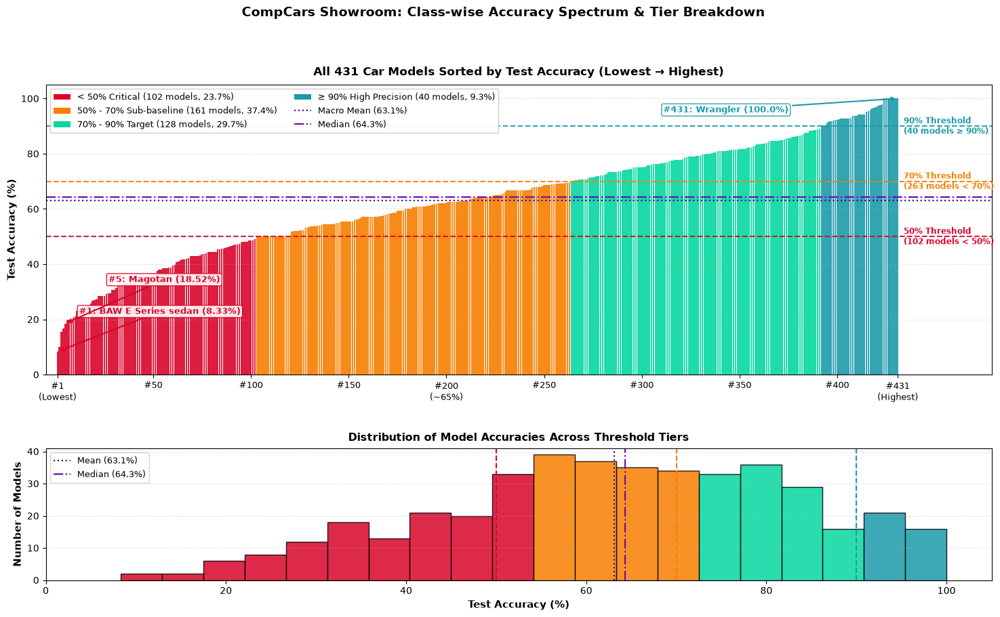

In [15]:
# Visualizations: Sorted Accuracy Bar Plot (Lowest → Highest) & Tier Breakdown
sorted_df = class_acc_df.sort_values(by="accuracy_pct", ascending=True).reset_index(drop=True)
sorted_df["rank"] = range(1, len(sorted_df) + 1)
n = len(sorted_df)

mean_acc = sorted_df["accuracy_pct"].mean()
median_acc = sorted_df["accuracy_pct"].median()

# Color-coding each bar according to threshold tiers
def get_tier_color(acc):
    if acc < 50.0:
        return "#d90429"  # Critical (<50%)
    elif acc < 70.0:
        return "#f77f00"  # Sub-baseline (50% - 70%)
    elif acc < 90.0:
        return "#06d6a0"  # Target Range (70% - 90%)
    else:
        return "#1b9aaa"  # High Precision (≥90%)

tier_colors = [get_tier_color(a) for a in sorted_df["accuracy_pct"]]

# Two-panel layout: Main Bar Plot + Distribution Histogram
fig = plt.figure(figsize=(18, 9.5), dpi=100)
gs = fig.add_gridspec(2, 1, height_ratios=[2.2, 1.0], hspace=0.35)

ax0 = fig.add_subplot(gs[0])
ax1 = fig.add_subplot(gs[1])

# --- Panel 1: Sorted Class Accuracy Bar Plot ---
bars = ax0.bar(sorted_df["rank"], sorted_df["accuracy_pct"], color=tier_colors, width=0.88, alpha=0.9)

# Highlight thresholds: 50%, 70%, 90%
ax0.axhline(50, color="#d90429", linestyle="--", linewidth=1.5, alpha=0.9)
ax0.axhline(70, color="#f77f00", linestyle="--", linewidth=1.5, alpha=0.9)
ax0.axhline(90, color="#1b9aaa", linestyle="--", linewidth=1.5, alpha=0.9)

# Summary central lines: Mean & Median
ax0.axhline(mean_acc, color="#3a0ca3", linestyle=":", linewidth=1.6)
ax0.axhline(median_acc, color="#7209b7", linestyle="-.", linewidth=1.6)

# Threshold labels on right axis margin
ax0.text(n + 3, 50, "50% Threshold\n(102 models < 50%)", va="center", ha="left", color="#d90429", fontsize=8.5, fontweight="bold")
ax0.text(n + 3, 70, "70% Threshold\n(263 models < 70%)", va="center", ha="left", color="#f77f00", fontsize=8.5, fontweight="bold")
ax0.text(n + 3, 90, "90% Threshold\n(40 models ≥ 90%)", va="center", ha="left", color="#1b9aaa", fontsize=8.5, fontweight="bold")

# Annotations for key landmark models
# 1. Lowest overall model
lowest_name = sorted_df.iloc[0]["class_name"].strip()
lowest_acc = sorted_df.iloc[0]["accuracy_pct"]
ax0.annotate(f"#1: {lowest_name} ({lowest_acc}%)",
             xy=(1, lowest_acc), xytext=(12, 22),
             arrowprops=dict(arrowstyle="->", color="#d90429", lw=1.5),
             fontsize=9, fontweight="bold", color="#d90429",
             bbox=dict(boxstyle="round,pad=0.2", facecolor="white", edgecolor="#d90429", alpha=0.9))

# 2. Magotan model
magotan_sub = sorted_df[sorted_df["model_id"] == 504]
if not magotan_sub.empty:
    m_idx = magotan_sub.index[0] + 1
    m_acc = magotan_sub["accuracy_pct"].values[0]
    ax0.annotate(f"#{m_idx}: Magotan ({m_acc}%)",
                 xy=(m_idx, m_acc), xytext=(m_idx + 22, m_acc + 15),
                 arrowprops=dict(arrowstyle="->", color="#d90429", lw=1.5),
                 fontsize=9, fontweight="bold", color="#d90429",
                 bbox=dict(boxstyle="round,pad=0.2", facecolor="white", edgecolor="#d90429", alpha=0.9))

# 3. Top-performing model
highest_name = sorted_df.iloc[-1]["class_name"].strip()
highest_acc = sorted_df.iloc[-1]["accuracy_pct"]
ax0.annotate(f"#431: {highest_name} ({highest_acc}%)",
             xy=(n, highest_acc), xytext=(n - 120, 95),
             arrowprops=dict(arrowstyle="->", color="#1b9aaa", lw=1.5),
             fontsize=9, fontweight="bold", color="#1b9aaa",
             bbox=dict(boxstyle="round,pad=0.2", facecolor="white", edgecolor="#1b9aaa", alpha=0.9))

# X-axis rank ticks (clean intervals without cluttering 431 model names)
ticks = [1, 50, 100, 150, 200, 250, 300, 350, 400, 431]
tick_labels = ["#1\n(Lowest)", "#50", "#100", "#150", "#200\n(~65%)", "#250", "#300", "#350", "#400", "#431\n(Highest)"]
ax0.set_xticks(ticks)
ax0.set_xticklabels(tick_labels, fontsize=9)
ax0.set_xlim(-5, n + 48)
ax0.set_ylim(0, 105)
ax0.set_ylabel("Test Accuracy (%)", fontsize=11, fontweight="bold")
ax0.set_title("All 431 Car Models Sorted by Test Accuracy (Lowest → Highest)", fontsize=12.5, fontweight="bold", pad=10)
ax0.grid(axis="y", alpha=0.3, linestyle="--")

legend_elements = [
    Patch(facecolor="#d90429", label="< 50% Critical (102 models, 23.7%)"),
    Patch(facecolor="#f77f00", label="50% - 70% Sub-baseline (161 models, 37.4%)"),
    Patch(facecolor="#06d6a0", label="70% - 90% Target (128 models, 29.7%)"),
    Patch(facecolor="#1b9aaa", label="≥ 90% High Precision (40 models, 9.3%)"),
    plt.Line2D([0], [0], color="#3a0ca3", linestyle=":", linewidth=1.6, label=f"Macro Mean ({mean_acc:.1f}%)"),
    plt.Line2D([0], [0], color="#7209b7", linestyle="-.", linewidth=1.6, label=f"Median ({median_acc:.1f}%)"),
]
ax0.legend(handles=legend_elements, loc="upper left", framealpha=0.95, fontsize=9, ncol=2)

# --- Panel 2: Accuracy Distribution Histogram ---
n_bins, bins, patches_hist = ax1.hist(sorted_df["accuracy_pct"], bins=20, edgecolor="black", alpha=0.85)
for p, bin_left in zip(patches_hist, bins[:-1]):
    if bin_left < 50:
        p.set_facecolor("#d90429")
    elif bin_left < 70:
        p.set_facecolor("#f77f00")
    elif bin_left < 90:
        p.set_facecolor("#06d6a0")
    else:
        p.set_facecolor("#1b9aaa")

ax1.axvline(50, color="#d90429", linestyle="--", linewidth=1.5)
ax1.axvline(70, color="#f77f00", linestyle="--", linewidth=1.5)
ax1.axvline(90, color="#1b9aaa", linestyle="--", linewidth=1.5)
ax1.axvline(mean_acc, color="#3a0ca3", linestyle=":", linewidth=1.6, label=f"Mean ({mean_acc:.1f}%)")
ax1.axvline(median_acc, color="#7209b7", linestyle="-.", linewidth=1.6, label=f"Median ({median_acc:.1f}%)")

ax1.set_xlim(0, 105)
ax1.set_xlabel("Test Accuracy (%)", fontsize=11, fontweight="bold")
ax1.set_ylabel("Number of Models", fontsize=11, fontweight="bold")
ax1.set_title("Distribution of Model Accuracies Across Threshold Tiers", fontsize=11.5, fontweight="bold", pad=8)
ax1.legend(loc="upper left", fontsize=9)
ax1.grid(axis="y", alpha=0.3, linestyle="--")

plt.suptitle("CompCars Showroom: Class-wise Accuracy Spectrum & Tier Breakdown", fontsize=14, y=1.002, fontweight="bold")
plt.tight_layout()
plt.show()

### 8. Top 10 Highest & Bottom 10 Lowest Accuracy Models

In [16]:
def search_models(query=None, min_acc=0.0, max_acc=100.0, limit=20, ascending=False):
    """
    Search and filter across all 431 car models, showing folder paths on disk.
    """
    res = class_acc_df[
        (class_acc_df["accuracy_pct"] >= min_acc) &
        (class_acc_df["accuracy_pct"] <= max_acc)
    ]
    if query:
        cond = res["class_name"].str.contains(query, case=False, na=False)
        if "make_name" in res.columns:
            cond = cond | res["make_name"].str.contains(query, case=False, na=False)
        res = res[cond]
    display_cols = ["model_id", "make_id", "make_name", "class_name", "accuracy_pct", "correct_samples", "total_samples", "folder_path"]
    available_cols = [c for c in display_cols if c in res.columns]
    return res[available_cols].sort_values(by="accuracy_pct", ascending=ascending).head(limit)

print("Top 10 Highest Accuracy Models (with Filesystem Folder Paths):")
display(search_models(limit=10, ascending=False))

print("\nBottom 10 Lowest Accuracy Models (with Filesystem Folder Paths):")
display(search_models(limit=10, ascending=True))

Top 10 Highest Accuracy Models (with Filesystem Folder Paths):


,model_id,make_id,make_name,class_name,accuracy_pct,correct_samples,total_samples,folder_path
353,1665,75,Chrey,Chrey X1,100.00,22,22,../compcars_cctv/extracted/data_extracted/data...
267,1246,29,Shangqidatong,MAXUS V80xs,100.00,12,12,../compcars_cctv/extracted/data_extracted/data...
280,1327,39,Toyota,Prius,100.00,9,9,../compcars_cctv/extracted/data_extracted/data...
322,1571,159,Lexus,Lexus IS convertible,100.00,24,24,../compcars_cctv/extracted/data_extracted/data...
180,735,11,Jeep,Wrangler,100.00,79,79,../compcars_cctv/extracted/data_extracted/data...
124,438,73,Volkswagen,Cross Lavida,100.00,13,13,../compcars_cctv/extracted/data_extracted/data...
133,458,73,Volkswagen,Golf convertible,100.00,10,10,../compcars_cctv/extracted/data_extracted/data...
155,553,36,Dongfengfengxing,Lingzhi,100.00,10,10,../compcars_cctv/extracted/data_extracted/data...
378,1796,149,Suzuki,Yuyan,97.92,47,48,../compcars_cctv/extracted/data_extracted/data...
199,831,15,MINI,MINI PACEMAN,97.56,40,41,../compcars_cctv/extracted/data_extracted/data...



Bottom 10 Lowest Accuracy Models (with Filesystem Folder Paths):


,model_id,make_id,make_name,class_name,accuracy_pct,correct_samples,total_samples,folder_path
92,328,58,BAW,BAW E Series sedan,8.33,1,12,../compcars_cctv/extracted/data_extracted/data...
223,959,118,Hyundai,Mistra,10.00,1,10,../compcars_cctv/extracted/data_extracted/data...
174,642,134,FIAT,Zhiyue,15.38,2,13,../compcars_cctv/extracted/data_extracted/data...
427,1962,84,Brabus,Brabus S Class,16.67,3,18,../compcars_cctv/extracted/data_extracted/data...
148,504,73,Volkswagen,Magotan,18.52,10,54,../compcars_cctv/extracted/data_extracted/data...
118,412,152,Changan,Ruiping,20.00,2,10,../compcars_cctv/extracted/data_extracted/data...
123,436,73,Volkswagen,Polo sedan,20.00,3,15,../compcars_cctv/extracted/data_extracted/data...
398,1886,28,Mitsubishi,Mitsubishi Fortis,20.00,2,10,../compcars_cctv/extracted/data_extracted/data...
299,1448,114,Haima,Qiubite,20.69,6,29,../compcars_cctv/extracted/data_extracted/data...
125,439,73,Volkswagen,Gran Lavida,21.05,4,19,../compcars_cctv/extracted/data_extracted/data...


### 9. CompCars CCTV (Surveillance) Overlap Analysis
Analyze how models that overlap with the CompCars CCTV surveillance dataset (`sv_data`) perform compared to showroom-exclusive models.

In [17]:
mappings_file = "compcars_431_model_mappings.csv"
if os.path.exists(mappings_file):
    mappings_df = pd.read_csv(mappings_file)
    cctv_merged = class_acc_df.merge(
        mappings_df[["class_index", "in_surveillance", "sv_model_id", "body_type"]],
        on="class_index",
        how="left"
    )
    
    cctv_shared = cctv_merged[cctv_merged["in_surveillance"] == True]
    showroom_only = cctv_merged[cctv_merged["in_surveillance"] == False]
    
    print(f"Total Benchmark Models               : {len(cctv_merged)}")
    print(f"  - Shared with CompCars CCTV        : {len(cctv_shared)} (Macro Mean Acc: {cctv_shared['accuracy_pct'].mean():.2f}%)")
    print(f"  - Showroom Only                    : {len(showroom_only)} (Macro Mean Acc: {showroom_only['accuracy_pct'].mean():.2f}%)")
    
    # Low accuracy (< 70%) breakdown
    low_acc_cctv = cctv_shared[cctv_shared["accuracy_pct"] < 70.0]
    print(f"\nCCTV-Shared Models with < 70% Accuracy : {len(low_acc_cctv)} / {len(cctv_shared)} ({len(low_acc_cctv)/len(cctv_shared)*100:.1f}%)")
    
    print("\nTop 10 Lowest Accuracy CCTV-Shared Models:")
    display(low_acc_cctv[["model_id", "sv_model_id", "make_name", "class_name", "body_type", "accuracy_pct", "total_samples"]].sort_values("accuracy_pct").head(10))

Total Benchmark Models               : 431
  - Shared with CompCars CCTV        : 181 (Macro Mean Acc: 63.08%)
  - Showroom Only                    : 250 (Macro Mean Acc: 63.17%)

CCTV-Shared Models with < 70% Accuracy : 110 / 181 (60.8%)

Top 10 Lowest Accuracy CCTV-Shared Models:


,model_id,sv_model_id,make_name,class_name,body_type,accuracy_pct,total_samples
223,959,253.0,Hyundai,Mistra,sedan,10.00,10
148,504,63.0,Volkswagen,Magotan,sedan,18.52,54
118,412,189.0,Changan,Ruiping,sedan,20.00,10
299,1448,153.0,Haima,Qiubite,hatchback,20.69,29
125,439,72.0,Volkswagen,Gran Lavida,hatchback,21.05,19
314,1543,116.0,Jianghuai,Heyue,sedan,24.44,45
221,957,248.0,Hyundai,Avante,sedan,25.00,16
33,105,268.0,BWM,BWM X5,SUV,25.68,74
420,1954,12.0,Zhonghua,Zhonghua Junjie,sedan,26.92,26
326,1587,22.0,Lexus,Lexus ES,sedan,28.57,14


### 10. Interactive Filesystem Image Inspection
Load and display real images from the dataset directory on disk for any given car model to analyze misclassifications or visual characteristics.

Model: Magotan (model_id: 504, make_id: 73)
Accuracy: 18.52% (10/54 correct)
Filesystem Folder: ../../compcars_cctv/extracted/data_extracted/data/image/73/504
Displaying 119 image(s) in a 4-column grid...


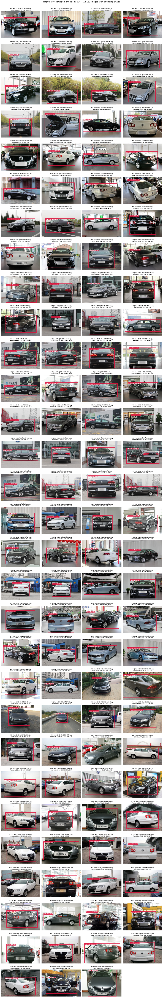

In [ ]:
def view_model_images(query, max_images=None, cols=4, show_bbox=True, year=None):
    """
    Look up any car model and display its actual images loaded directly from the filesystem folder,
    with official bounding box annotations overlaid in a clean grid layout.
    
    Parameters:
        query: model_id (int, e.g. 504) or car model name (str, e.g. "Magotan")
        max_images: max images to display (default: None, displays ALL images)
        cols: number of images per row in the grid (default: 4)
        show_bbox: whether to draw bounding boxes and viewpoints (default: True)
        year: filter by release year (e.g. "2009", "2011") or None for all years
    """
    viewpoint_map = {
        -1: "Uncertain",
        1: "Front",
        2: "Rear",
        3: "Side",
        4: "Front-side",
        5: "Rear-side"
    }

    if isinstance(query, int):
        match = class_acc_df[class_acc_df["model_id"] == query]
    else:
        match = class_acc_df[class_acc_df["class_name"].str.contains(str(query), case=False, na=False)]
    
    if match.empty:
        print(f"No model found matching '{query}'.")
        return
    
    row = match.iloc[0]
    
    # Dynamically resolve filesystem folder path using IMG_DIR
    if "IMG_DIR" in globals() and os.path.exists(IMG_DIR):
        folder = os.path.join(IMG_DIR, f"{int(row['make_id'])}/{int(row['model_id'])}")
    else:
        folder = row["folder_path"]
        if not os.path.exists(folder):
            folder = os.path.join("../../compcars_cctv/extracted/data_extracted/data/image", f"{int(row['make_id'])}/{int(row['model_id'])}")

    print(f"Model: {row['class_name']} (model_id: {row['model_id']}, make_id: {row.get('make_id', 'N/A')})")
    print(f"Accuracy: {row['accuracy_pct']}% ({row['correct_samples']}/{row['total_samples']} correct)")
    print(f"Filesystem Folder: {folder}")
    
    # Collect all image files from this folder
    found_files = []
    if os.path.exists(folder):
        for root, _, files in os.walk(folder):
            rel_year = os.path.basename(root)
            if year is not None and str(year) != str(rel_year):
                continue
            for f in sorted(files):
                if f.lower().endswith((".jpg", ".jpeg", ".png")):
                    found_files.append(os.path.join(root, f))
                    if max_images is not None and len(found_files) >= max_images:
                        break
            if max_images is not None and len(found_files) >= max_images:
                break
    
    total_found = len(found_files)
    if total_found == 0:
        print(f"No image files found in folder for year={year}.")
        return
        
    print(f"Displaying {total_found} image(s) in a {cols}-column grid...")
    
    num_rows = int(np.ceil(total_found / cols))
    fig, axes = plt.subplots(num_rows, cols, figsize=(4.2 * cols, 3.4 * num_rows))
    
    if num_rows == 1 and cols == 1:
        axes_flat = [axes]
    elif num_rows == 1 or cols == 1:
        axes_flat = list(axes)
    else:
        axes_flat = list(axes.flatten())

    for idx, p in enumerate(found_files):
        ax = axes_flat[idx]
        
        # Locate corresponding bounding box label file
        lbl_p = p.replace("/image/", "/label/").rsplit(".", 1)[0] + ".txt"
        bbox = None
        vp_name = "Unknown"
        if os.path.exists(lbl_p):
            with open(lbl_p, "r") as lf:
                lbl_lines = lf.readlines()
            if len(lbl_lines) >= 3:
                vp = int(lbl_lines[0].strip())
                vp_name = viewpoint_map.get(vp, f"VP {vp}")
                x1, y1, x2, y2 = [int(v) for v in lbl_lines[2].strip().split()]
                bbox = (x1, y1, x2, y2)

        with Image.open(p) as im:
            im_rgb = im.convert("RGB")
            ax.imshow(im_rgb)
            img_year = os.path.basename(os.path.dirname(p))
            fname = os.path.basename(p)

            if bbox and show_bbox:
                w = bbox[2] - bbox[0]
                h = bbox[3] - bbox[1]
                rect = patches.Rectangle(
                    (bbox[0], bbox[1]), w, h,
                    linewidth=2.2, edgecolor="crimson", facecolor="none"
                )
                ax.add_patch(rect)
                ax.text(
                    bbox[0] + 5, bbox[1] + 25, f"{vp_name} [{w}x{h}]",
                    color="white", fontsize=8, fontweight="bold",
                    bbox=dict(boxstyle="round,pad=0.2", facecolor="crimson", alpha=0.85, edgecolor="none")
                )
                ax.set_title(f"#{idx+1} [Year {img_year}] {fname}\n{vp_name} BBox: {bbox}", fontsize=8.5)
            else:
                ax.set_title(f"#{idx+1} [Year {img_year}] {fname}", fontsize=8.5)
            ax.axis("off")

    # Hide any unused axes in the grid
    for idx in range(total_found, len(axes_flat)):
        axes_flat[idx].axis("off")

    plt.suptitle(
        f"{row['class_name']} ({row.get('make_name', '')}, model_id: {row['model_id']}) - All {total_found} Images with Bounding Boxes",
        fontsize=14, y=1.002
    )
    plt.tight_layout()
    plt.show()

# View ALL images with bounding boxes for Magotan (model_id: 504)
view_model_images(504, max_images=None, cols=4, show_bbox=True)